# Import required packages

In [48]:
from omero.gateway import BlitzGateway, ColorHolder
from omero.model import MaskI
from omero.rtypes import (
    rdouble,
    rint,
    rstring,
)
import omero_rois
import omero
from getpass import getpass
from cellpose import models, utils,plot,io
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import time
from skimage.measure import label
%matplotlib inline
matplotlib.rcParams['figure.figsize'] = [8, 6]

# Login to OMERO

In [2]:
def connect(hostname, username, password):
    """
    Connect to an OMERO server
    :param hostname: Host name
    :param username: User
    :param password: Password
    :return: Connected BlitzGateway
    """
    conn = BlitzGateway(username, password,
                        host=hostname, port=4064, secure=True)
    conn.connect()
    conn.c.enableKeepAlive(600)
    return conn

HOST = '35.8.197.106'
conn = connect(HOST, input("Username: "),
               getpass("OMERO Password: "))
print("Connected as {}".format(conn.getUser().getName()))

Username: JonathanSakkos
OMERO Password: ········
Connected as JonathanSakkos


# Select an image and get its description from the server

In [13]:
image_id = 4360
image = conn.getObject("Image", image_id)
print(image.getName(), image.getDescription())

CscB-SPS-0924-tags-mNG -IPTG-02.czi 


# View image channels separately

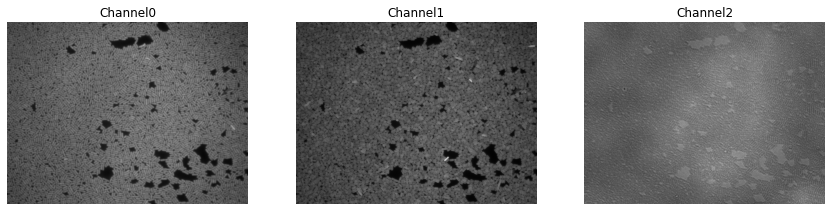

In [15]:
get_ipython().run_line_magic('matplotlib', 'inline')
pixels = image.getPrimaryPixels()
channels = image.getChannels()
plt.figure(figsize=(25, 20))
size_c = image.getSizeC()
for idx in range(0, size_c):
    plt.subplot(1, 5, idx+1)
    image_plane = pixels.getPlane(0, idx, 0)
    plt.imshow(image_plane, cmap='gray')
    plt.axis('off')
    plt.title('Channel' + str(idx))

# List Channels (loads the Rendering settings to get channel colors)

In [16]:

for channel in image.getChannels():
    print('Channel:', channel.getLabel())
    print('Color:', channel.getColor().getRGB())
    print('Lookup table:', channel.getLut())
    print('Is reverse intensity?', channel.isReverseIntensity())

Channel: TaYFP
Color: (0, 255, 23)
Lookup table: None
Is reverse intensity? False
Channel: DsRed
Color: (255, 0, 255)
Lookup table: None
Is reverse intensity? False
Channel: Bright
Color: (255, 255, 255)
Lookup table: None
Is reverse intensity? False


In [17]:
def find_chan(image,channel):
    
    """
    Finds the specified channel number from the image metadata
    """
    
    for i, chan in enumerate(image.getChannels()):
        #print(i, dic)
        if chan.getLabel() == channel:
            return i
    return -1

# Find DsRed channel for segmentation

In [18]:
dsred_channel = find_chan(image,'DsRed')
dsred = pixels.getPlane(0, dsred_channel, 0)
dsred.shape

(1460, 1936)

In [19]:
!nvcc --version
!nvidia-smi

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2019 NVIDIA Corporation
Built on Wed_Oct_23_19:32:27_Pacific_Daylight_Time_2019
Cuda compilation tools, release 10.2, V10.2.89
Thu Mar 04 14:56:34 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 441.22       Driver Version: 441.22       CUDA Version: 10.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name            TCC/WDDM | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  GeForce GTX 166... WDDM  | 00000000:1C:00.0  On |                  N/A |
|  0%   43C    P8    18W / 130W |   3852MiB /  6144MiB |      3%      Default |
+-------------------------------+----------------------+----------------------+
                                                                

In [20]:
use_GPU = models.use_gpu()
print('>>> GPU activated? %d'%use_GPU)

** TORCH CUDA version installed and working. **
>>> GPU activated? 1


# Segment image with Cellpose

In [21]:
model = models.Cellpose(gpu=True,model_type='cyto')
masks, flows, styles, diams = model.eval(dsred, diameter=20)
# save results
#io.masks_flows_to_seg(dsred, masks, flows, diams, f)




** TORCH CUDA version installed and working. **
>>>> using GPU
processing 1 image(s)
time spent: running network 10.30s; flow+mask computation 105.92
estimated masks for 1 image(s) in 116.33 sec
>>>> TOTAL TIME 116.33 sec


In [22]:
#Save mask
np.save(str(image.getId()) + '_mask.npy',masks)

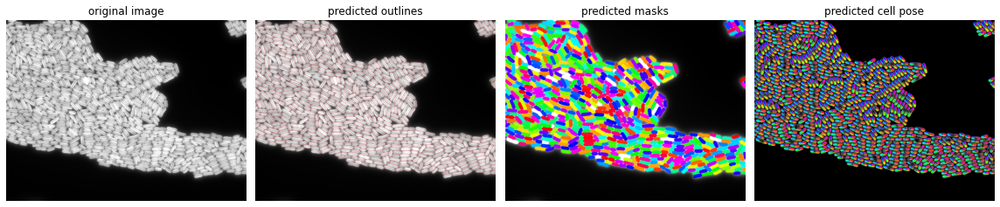

In [73]:
fig = plt.figure(figsize=(16,5))
plot.show_segmentation(fig, dsred, masks, flows[0])
plt.tight_layout()
plt.show()

In [74]:
updateService = conn.getUpdateService()


# Turn labelled image (mask) into a mask for OMERO

In [23]:
msks = omero_rois.masks_from_label_image(masks)

In [76]:

# We have a helper function for creating an ROI and linking it to new shapes
def create_roi(img, shapes):
    # create an ROI, link it to Image
    roi = omero.model.RoiI()
    # use the omero.model.ImageI that underlies the 'image' wrapper
    roi.setImage(img._obj)
    for shape in shapes:
        roi.addShape(shape)
    # Save the ROI (saves any linked shapes too)
    return updateService.saveAndReturnObject(roi)

In [40]:
badMask = np.load ('4359_mask.npy')
goodMask = np.load ('4360_mask.npy')

In [41]:
badMask

array([[   0,    0,    0, ...,    0,    0,    0],
       [   0,    0,    0, ...,   34,    0,    0],
       [   0,    0,    0, ...,   34,   34,   34],
       ...,
       [   0, 4041, 4041, ..., 4040, 4040, 4040],
       [   0, 4041, 4041, ..., 4040, 4040, 4040],
       [   0, 4041, 4041, ..., 4040, 4040, 4040]])

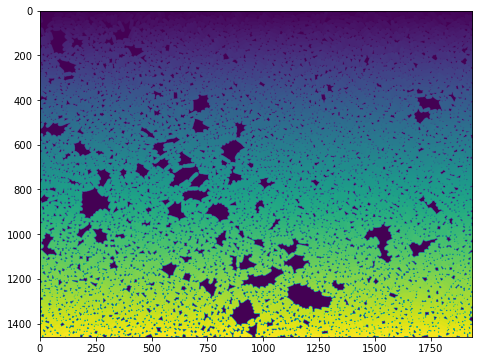

In [42]:
plt.imshow(badMask)

In [57]:
np.where(badMask==1)

(array([0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3,
        3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5,
        5, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 7], dtype=int64),
 array([233, 234, 235, 236, 237, 238, 239, 228, 229, 230, 231, 232, 233,
        234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 228, 229, 230,
        231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 229,
        230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 230,
        231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 230, 231, 232,
        233, 234, 235, 236, 237, 238, 239, 233, 234, 235, 236, 237, 235],
       dtype=int64))

In [56]:
start_time = time.time()
for i in range(badMask.max()):
    tmp = np.where(badMask==i)
    for a in tmp:
        if a.size == 0:
            print('Mask is empty')
current_time = time.time()

elapsed_time = current_time - start_time
print("Finished iterating in: " + str(int(elapsed_time))  + " seconds")

Mask is empty
Mask is empty
Finished iterating in: 40 seconds


In [51]:
start_time = time.time()
msklabel = label(badMask)
current_time = time.time()

elapsed_time = current_time - start_time
print("Finished iterating in: " + str(int(elapsed_time))  + " seconds")

Finished iterating in: 0 seconds


In [38]:
goodMask.max()

4121

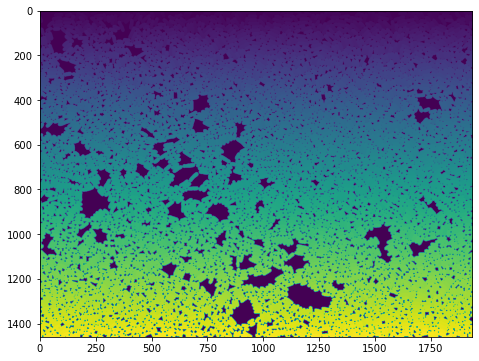

In [54]:
plt.imshow(msklabel)

In [52]:
for mask in [msklabel,goodMask]:
    msks = omero_rois.masks_from_label_image(mask)


In [60]:
goodMask

array([[   0,    0,    0, ...,   18,    0,    0],
       [   0,    0,    0, ...,   18,   18,   18],
       [   0,    0,    0, ...,   18,   18,   18],
       ...,
       [   0,    0,    0, ..., 4077, 4077, 4077],
       [   0,    0,    0, ..., 4077, 4077, 4077],
       [   0,    0,    0, ..., 4077, 4077, 4077]])

In [59]:
label(goodMask)

array([[   0,    0,    0, ...,   38,    0,    0],
       [   0,    0,    0, ...,   38,   38,   38],
       [   0,    0,    0, ...,   38,   38,   38],
       ...,
       [   0,    0,    0, ..., 4039, 4039, 4039],
       [   0,    0,    0, ..., 4039, 4039, 4039],
       [   0,    0,    0, ..., 4039, 4039, 4039]], dtype=int64)

# Create ROI from mask and attach to image

In [77]:
#create_roi(image,msks)

object #0 (::omero::model::Roi)
{
    _id = object #1 (::omero::RLong)
    {
        _val = 103
    }
    _details = object #2 (::omero::model::Details)
    {
        _owner = object #3 (::omero::model::Experimenter)
        {
            _id = object #4 (::omero::RLong)
            {
                _val = 52
            }
            _details = object #5 (::omero::model::Details)
            {
                _owner = <nil>
                _group = <nil>
                _creationEvent = <nil>
                _updateEvent = <nil>
                _permissions = object #6 (::omero::model::Permissions)
                {
                    _restrictions = 
                    {
                        [0] = False
                        [1] = True
                        [2] = True
                        [3] = True
                        [4] = True
                        [5] = True
                    }
                    _extendedRestrictions = 
                    {
               

# Disconnect from server to free up resources

In [78]:
def disconnect(conn):
    """
    Disconnect from an OMERO server
    :param conn: The BlitzGateway
    """
    conn.close()

disconnect(conn)